#Pretrained Pipelines for PDF Deidentification

Pretrained pipelines designed to mask, obfuscate PHI entities from pdf documents.

##Set up environment

In [ ]:
secret = ""
license = ""
aws_access_key = ""
aws_secret_key = ""
version = secret.split("-")[0]
spark_ocr_jar_path = "../../target/scala-2.12"

###Initialization of spark session

In [ ]:
from sparkocr import start
import os
import sys

if license:
    os.environ['JSL_OCR_LICENSE'] = license
    os.environ['SPARK_NLP_LICENSE'] = license

if aws_access_key:
    os.environ['AWS_ACCESS_KEY'] = aws_access_key
    os.environ['AWS_SECRET_ACCESS_KEY'] = aws_secret_key

nlp_secret = ""

spark = start(secret=secret,
              jar_path=spark_ocr_jar_path, nlp_internal="6.1.0", nlp_version="6.1.1", nlp_secret=nlp_secret)

spark

Spark version: 3.5.0
Spark NLP version: 6.0.3
Spark NLP for Healthcare version: 6.0.3
Spark OCR version: 6.0.1rc2



##Download pdf files

In [ ]:
!wget https://raw.githubusercontent.com/JohnSnowLabs/pdf-deid-dataset/main/PDF_Original/Easy/PDF_Deid_Deidentification_1.pdf
!wget https://raw.githubusercontent.com/JohnSnowLabs/pdf-deid-dataset/main/PDF_Original/Easy/PDF_Deid_Deidentification_2.pdf
!wget https://raw.githubusercontent.com/JohnSnowLabs/pdf-deid-dataset/main/PDF_Original/Easy/PDF_Deid_Deidentification_3.pdf

##Pretrained Pipelines

##1. pdf_deid_multi_model_context_pipeline

This pipeline can be used to mask PHI information in PDFs.

####Load pretrained pipeline

In [ ]:
from sparknlp.pretrained import PretrainedPipeline
deid_pipeline1 = PretrainedPipeline("pdf_deid_multi_model_context_pipeline", "en", "clinical/ocr")

pdf_deid_multi_model_context_pipeline download started this may take some time.
Approx size to download 4.4 GB
[OK!]


####Load test pdf

In [ ]:
pdf_path1 = '/content/PDF_Deid_Deidentification_1.pdf'
pdf_example_df1 = spark.read.format("binaryFile").load(pdf_path1).cache()
pdf_example_df1.select("path").show(truncate=False)

+---------------------------------------------+
|path                                         |
+---------------------------------------------+
|file:/content/PDF_Deid_Deidentification_1.pdf|
+---------------------------------------------+



####Run pipeline

In [ ]:
result1 = deid_pipeline1.transform(pdf_example_df1)
df1 = result1.select("path", "pdf").withColumnRenamed("pdf", "content")

####Show results


    Image #0:
    Origin: file:/content/PDF_Deid_Deidentification_1.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


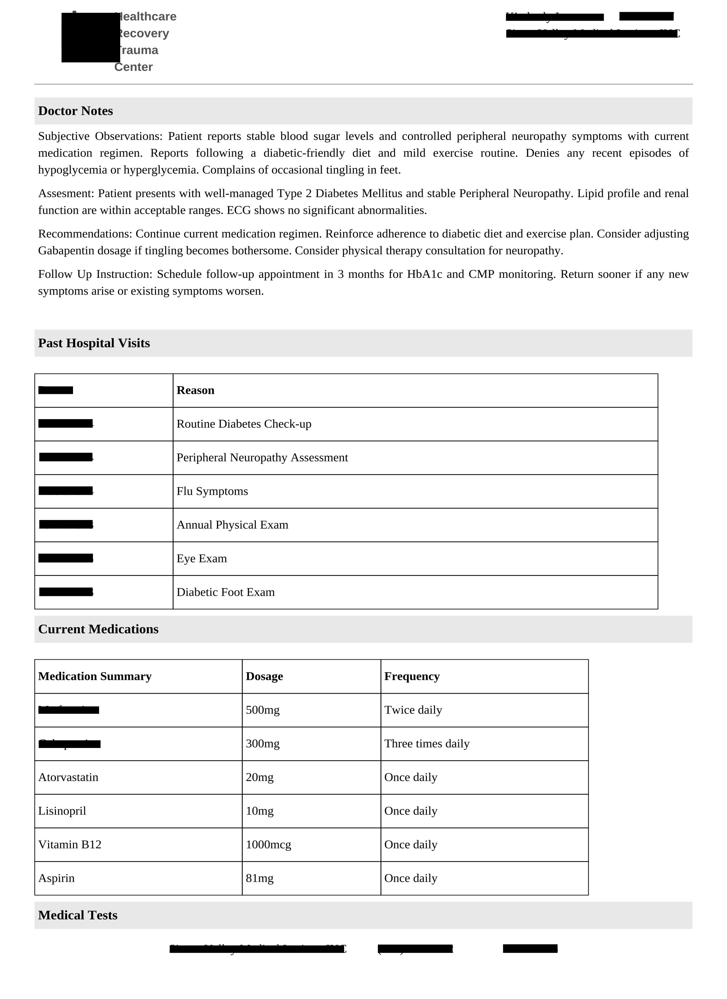


    Image #1:
    Origin: file:/content/PDF_Deid_Deidentification_1.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


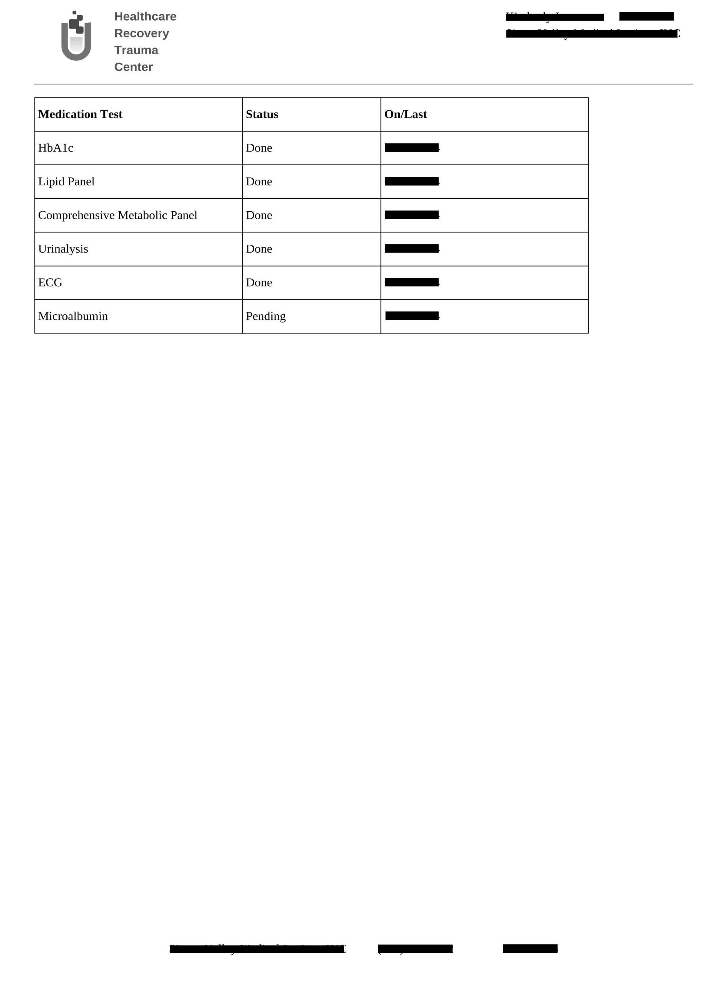


    Image #2:
    Origin: file:/content/PDF_Deid_Deidentification_1.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


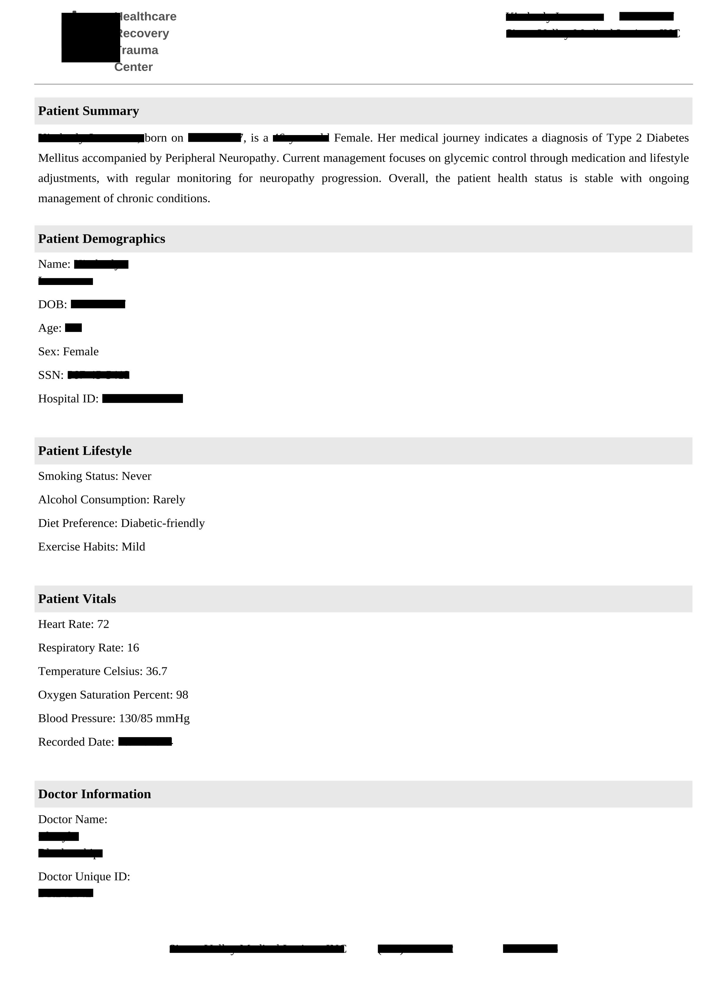

In [ ]:
from sparkocr.utils import *
display_pdf(df1)

###2. pdf_deid_multi_model_context_signature_aware_pipeline

This pipeline can be used to mask PHI information in PDFs, including signatures

####Load pretrained pipeline

In [ ]:
from sparknlp.pretrained import PretrainedPipeline
deid_pipeline2 = PretrainedPipeline("pdf_deid_multi_model_context_signature_aware_pipeline", "en", "clinical/ocr")

pdf_deid_multi_model_context_signature_aware_pipeline download started this may take some time.
Approx size to download 4.7 GB
[OK!]


####Load test pdf

In [ ]:
pdf_path2 = '/content/PDF_Deid_Deidentification_2.pdf'
pdf_example_df2 = spark.read.format("binaryFile").load(pdf_path2).cache()
pdf_example_df2.select("path").show(truncate=False)

+---------------------------------------------+
|path                                         |
+---------------------------------------------+
|file:/content/PDF_Deid_Deidentification_2.pdf|
+---------------------------------------------+



####Run pipeline

In [ ]:
result2 = deid_pipeline2.transform(pdf_example_df2)
df2 = result2.select("path", "pdf").withColumnRenamed("pdf", "content")

####Show results


    Image #0:
    Origin: file:/content/PDF_Deid_Deidentification_2.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


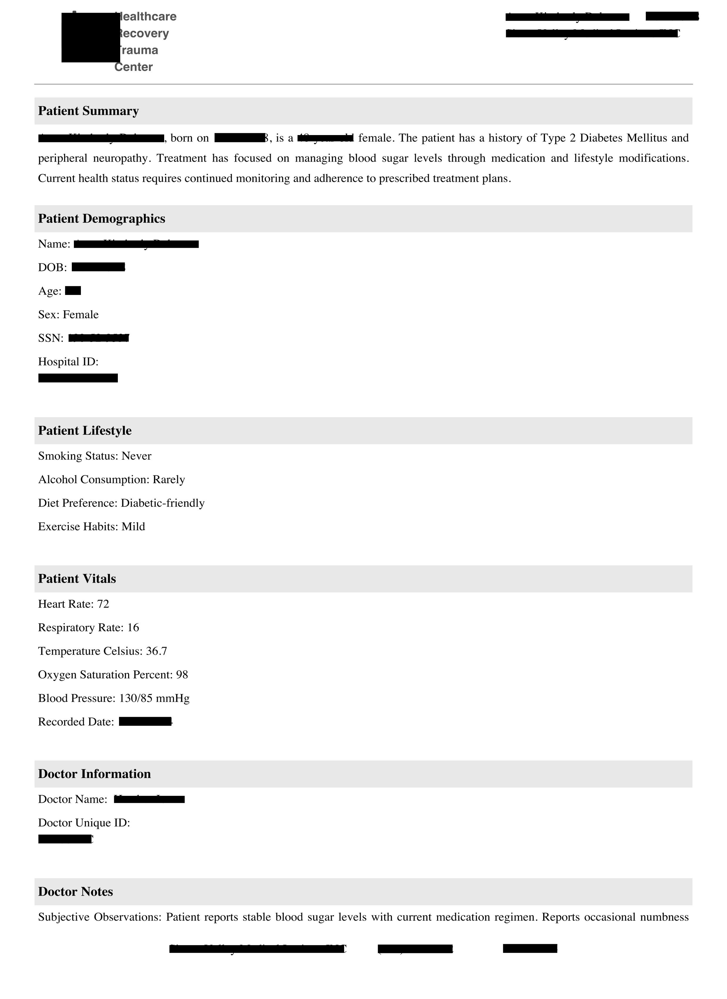


    Image #1:
    Origin: file:/content/PDF_Deid_Deidentification_2.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


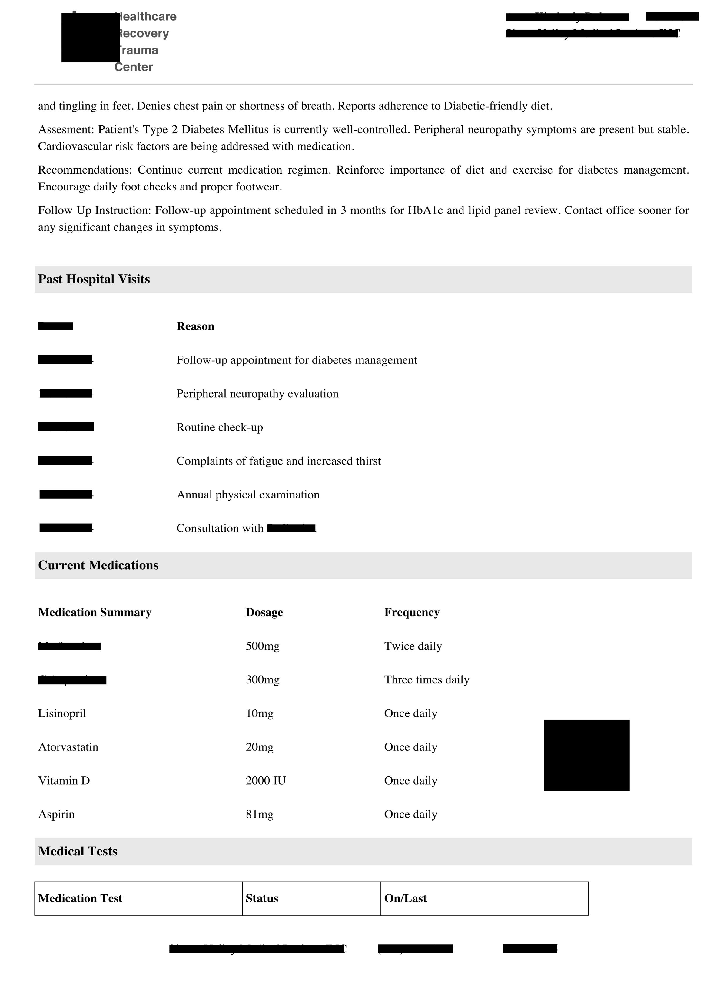


    Image #2:
    Origin: file:/content/PDF_Deid_Deidentification_2.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


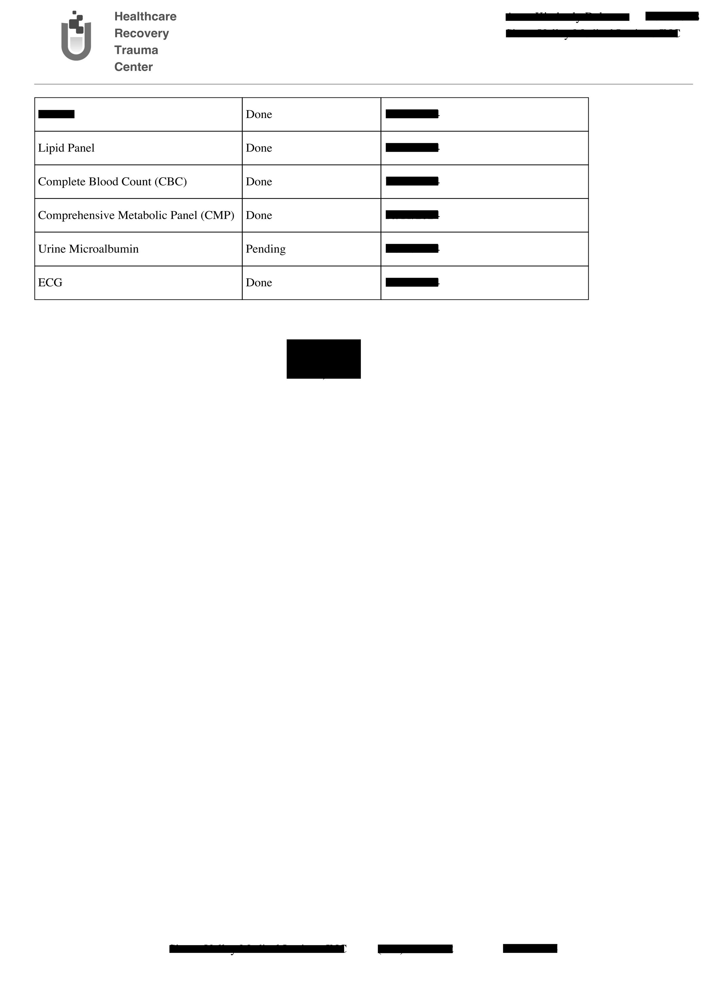

In [ ]:
from sparkocr.utils import *
display_pdf(df2)

###3. pdf_obfuscation_multi_model_context_pipeline

This pipeline can be used to obfuscate PHI information in PDFs.

####Load pretrained pipeline

In [ ]:
from sparknlp.pretrained import PretrainedPipeline
deid_pipeline3 = PretrainedPipeline("pdf_obfuscation_multi_model_context_pipeline", "en", "clinical/ocr")

pdf_obfuscation_multi_model_context_pipeline download started this may take some time.
Approx size to download 4.4 GB
[OK!]


####Load test pdf

In [ ]:
pdf_path3 = '/content/PDF_Deid_Deidentification_3.pdf'
pdf_example_df3 = spark.read.format("binaryFile").load(pdf_path3).cache()
pdf_example_df3.select("path").show(truncate=False)

+---------------------------------------------+
|path                                         |
+---------------------------------------------+
|file:/content/PDF_Deid_Deidentification_3.pdf|
+---------------------------------------------+



####Run pipeline

In [ ]:
result3 = deid_pipeline3.transform(pdf_example_df3)
df3 = result3.select("path", "pdf").withColumnRenamed("pdf", "content")

####Show results


    Image #0:
    Origin: file:/content/PDF_Deid_Deidentification_3.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


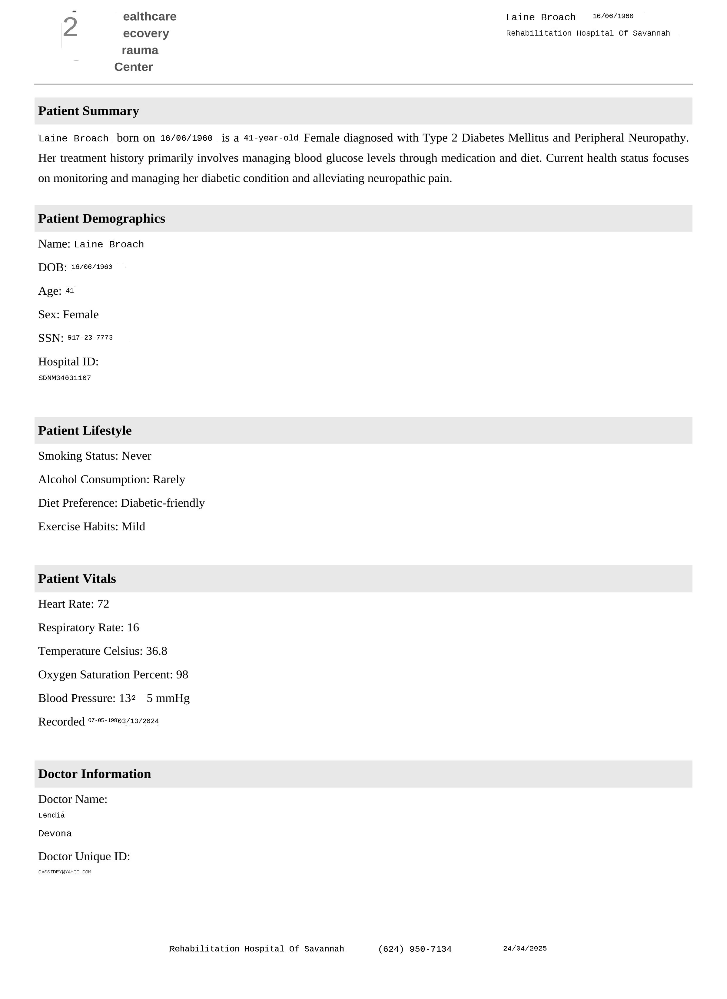


    Image #1:
    Origin: file:/content/PDF_Deid_Deidentification_3.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


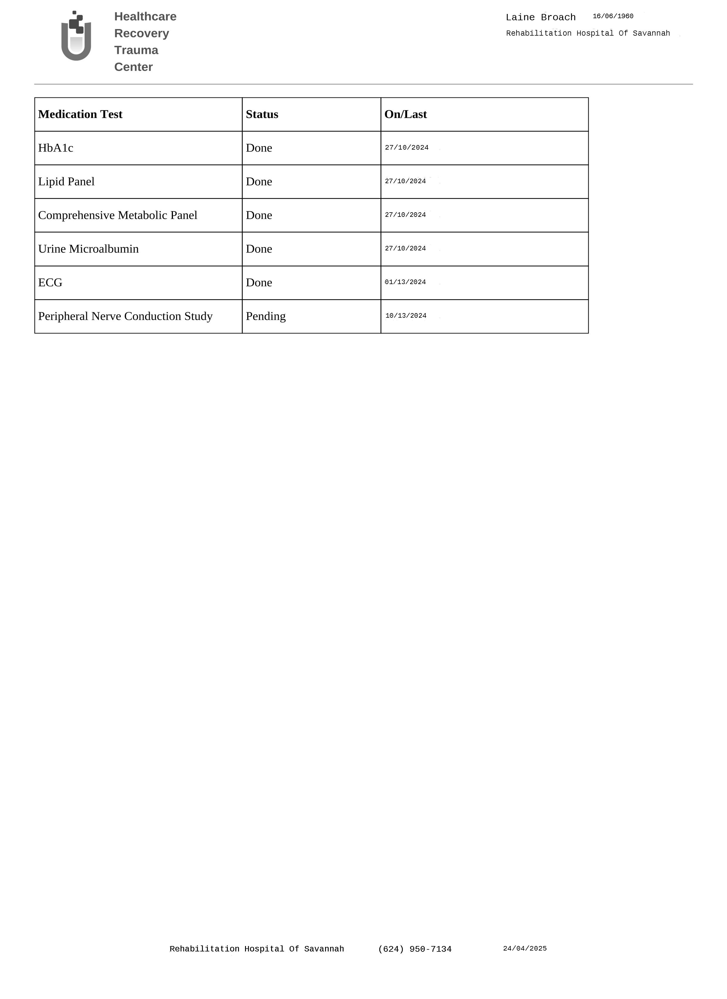


    Image #2:
    Origin: file:/content/PDF_Deid_Deidentification_3.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


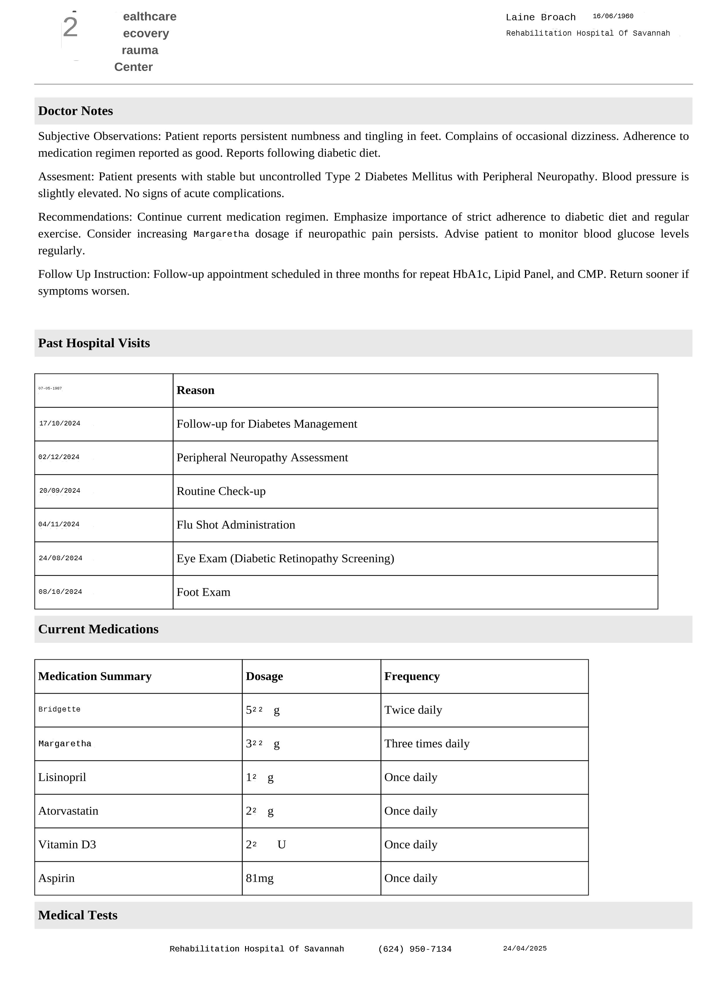

In [ ]:
from sparkocr.utils import *
display_pdf(df3)

###4. pdf_deid_multilingual_name_plus

This pipeline can be used to redact PHI information in PDFs.

####Load pretrained pipeline

In [ ]:
from sparknlp.pretrained import PretrainedPipeline
deid_pipeline4 = PretrainedPipeline("pdf_deid_multilingual_name_plus", "en", "clinical/ocr")

pdf_deid_multilingual_name_plus download started this may take some time.
Approx size to download 3.8 GB
[OK!]


####Load test pdf

In [ ]:
pdf_path4 = '/content/PDF_Deid_Deidentification_1.pdf'
pdf_example_df4 = spark.read.format("binaryFile").load(pdf_path4).cache()
pdf_example_df4.select("path").show(truncate=False)

+---------------------------------------------+
|path                                         |
+---------------------------------------------+
|file:/content/PDF_Deid_Deidentification_1.pdf|
+---------------------------------------------+



####Run pipeline

In [ ]:
result4 = deid_pipeline4.transform(pdf_example_df4)
df4 = result4.select("path", "pdf").withColumnRenamed("pdf", "content")

####Show results


    Image #0:
    Origin: file:/content/PDF_Deid_Deidentification_1.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


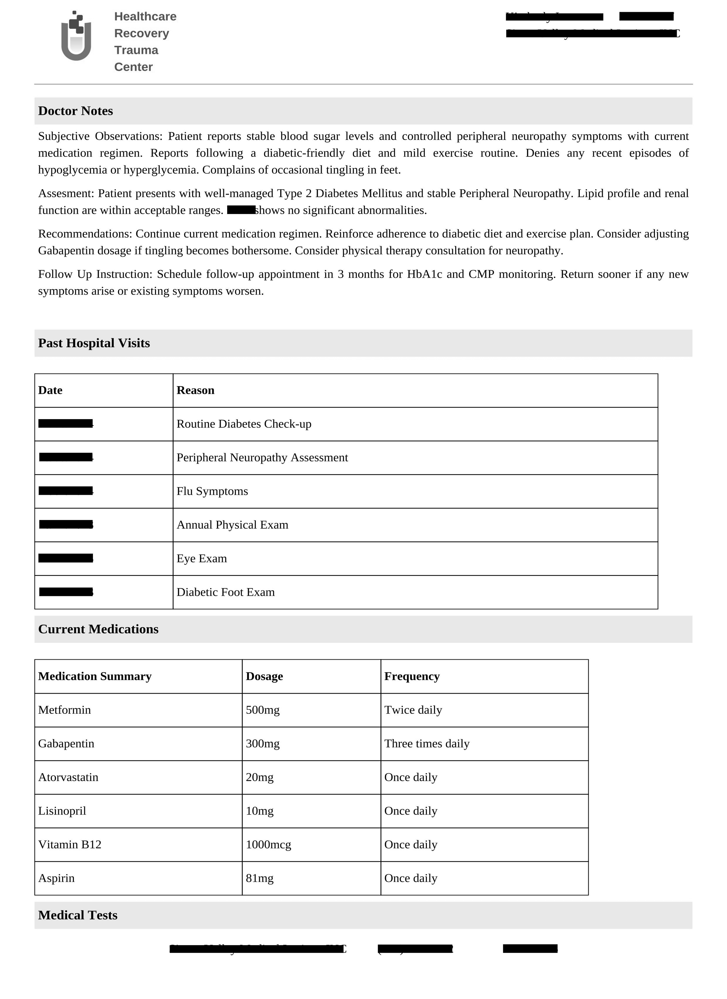


    Image #1:
    Origin: file:/content/PDF_Deid_Deidentification_1.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


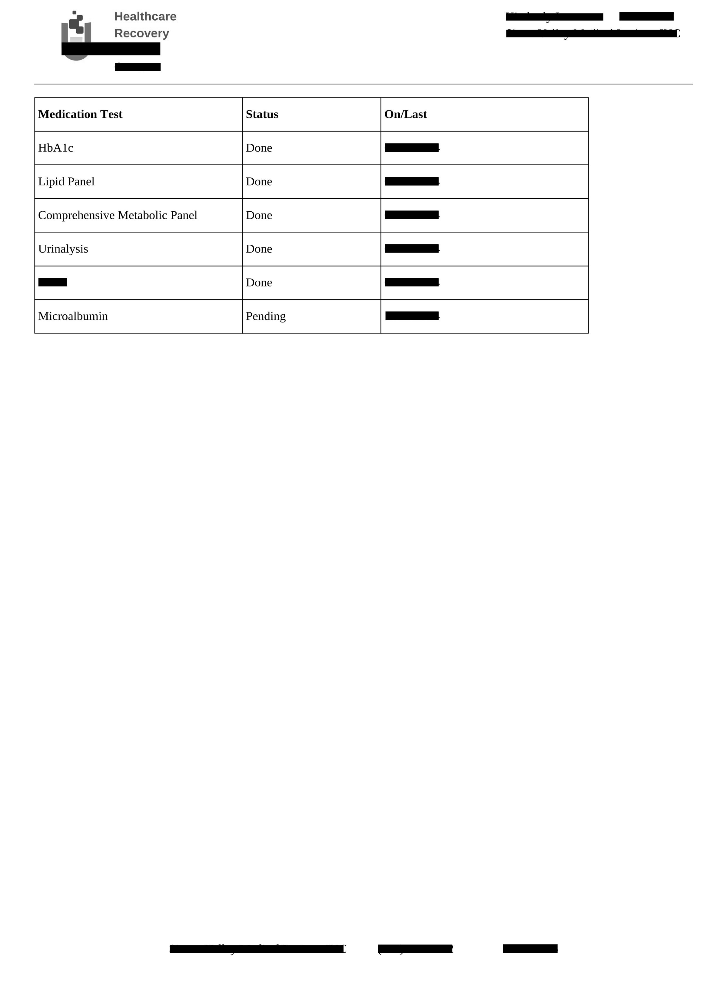


    Image #2:
    Origin: file:/content/PDF_Deid_Deidentification_1.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


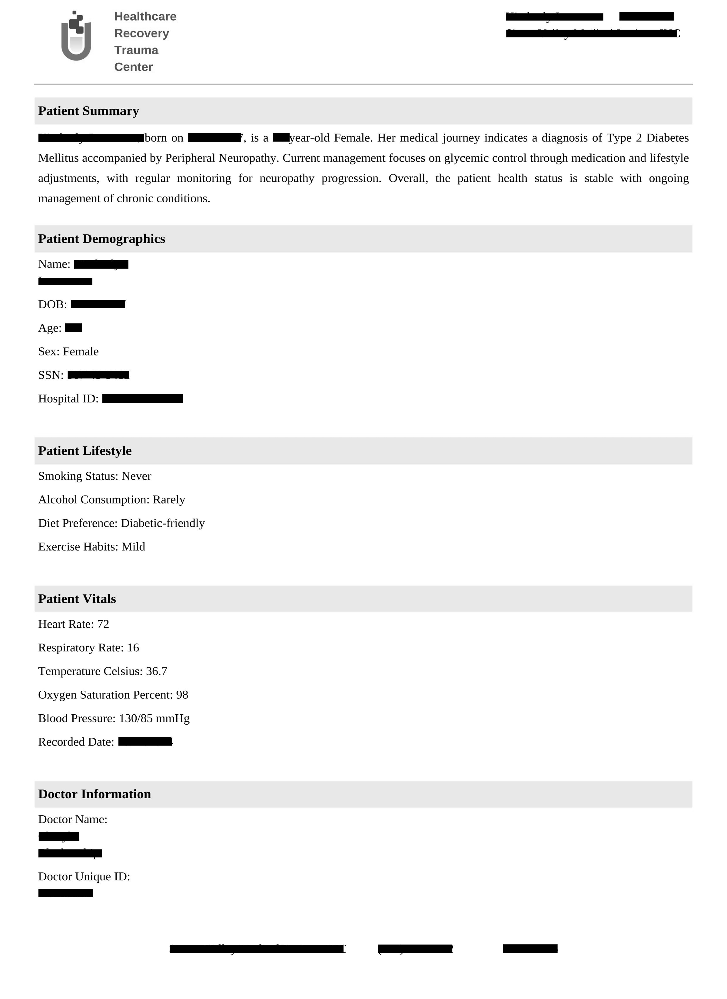

In [ ]:
from sparkocr.utils import *
display_pdf(df4)

###5. pdf_deid_multilingual_name_plus_signature_aware

This pipeline can be used to mask PHI information in PDFs, including signatures.

####Load pretrained pipeline

In [ ]:
from sparknlp.pretrained import PretrainedPipeline
deid_pipeline5 = PretrainedPipeline("pdf_deid_multilingual_name_plus_signature_aware", "en", "clinical/ocr")

pdf_deid_multilingual_name_plus_signature_aware download started this may take some time.
Approx size to download 4 GB
[OK!]


####Load test pdf

In [ ]:
pdf_path5 = '/content/PDF_Deid_Deidentification_2.pdf'
pdf_example_df5 = spark.read.format("binaryFile").load(pdf_path5).cache()
pdf_example_df5.select("path").show(truncate=False)

+---------------------------------------------+
|path                                         |
+---------------------------------------------+
|file:/content/PDF_Deid_Deidentification_2.pdf|
+---------------------------------------------+



####Run pipeline

In [ ]:
result5 = deid_pipeline5.transform(pdf_example_df5)
df5 = result5.select("path", "pdf").withColumnRenamed("pdf", "content")

####Show results


    Image #0:
    Origin: file:/content/PDF_Deid_Deidentification_2.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


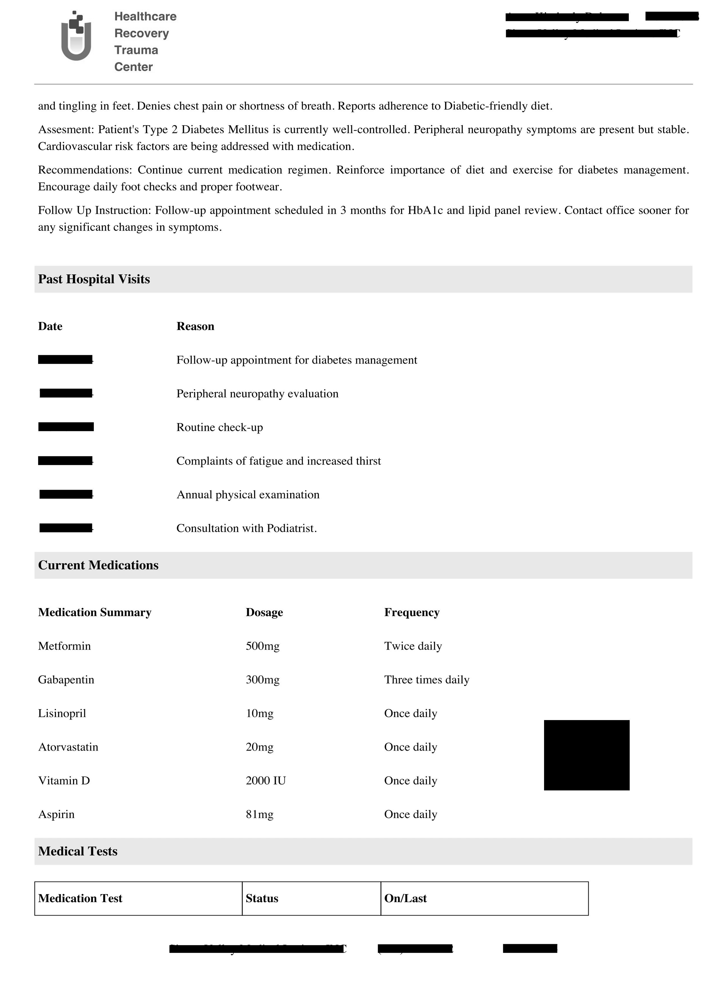


    Image #1:
    Origin: file:/content/PDF_Deid_Deidentification_2.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


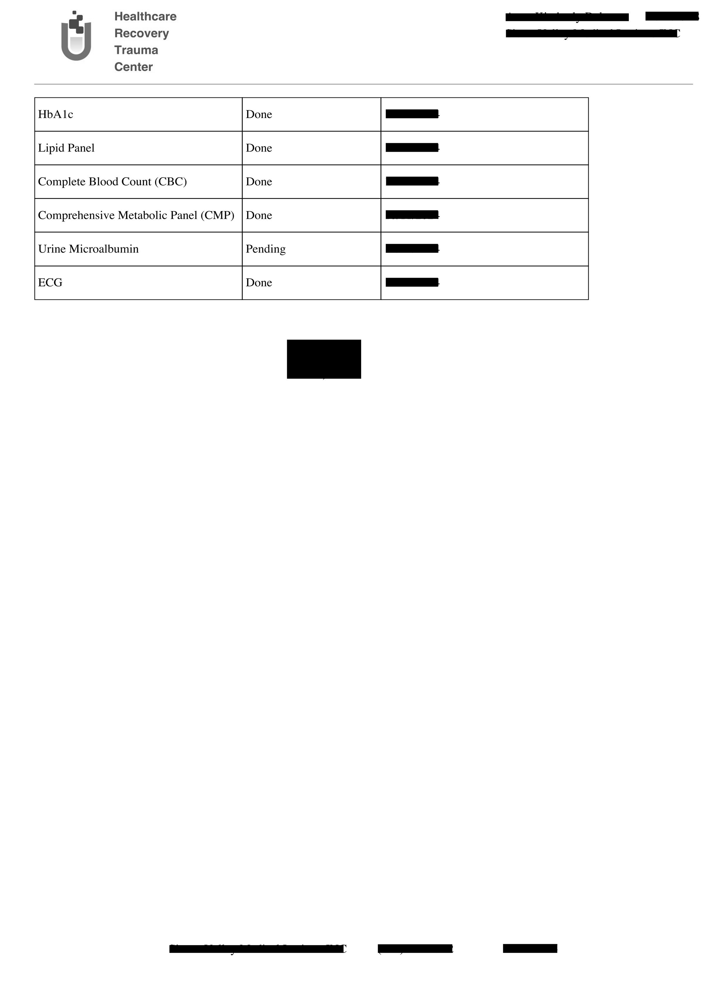


    Image #2:
    Origin: file:/content/PDF_Deid_Deidentification_2.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


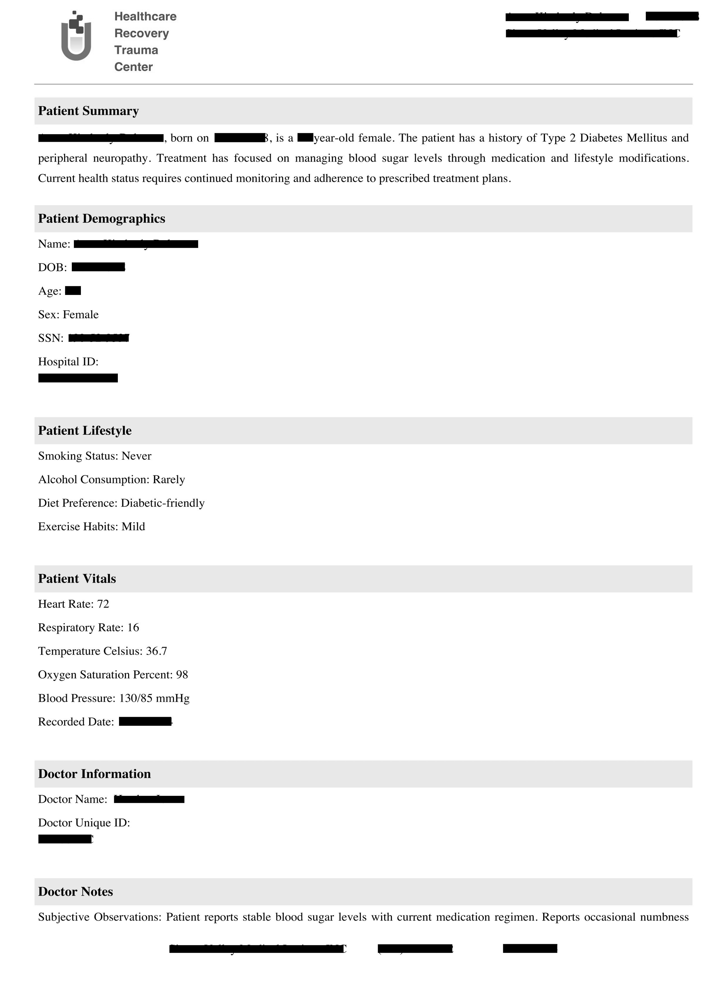

In [ ]:
from sparkocr.utils import *
display_pdf(df5)

###6. pdf_obfuscate_multilingual_name_plus

This pipeline can be used to obfuscate PHI information in PDFs.

####Load pretrained pipeline

In [ ]:
from sparknlp.pretrained import PretrainedPipeline
deid_pipeline6 = PretrainedPipeline("pdf_obfuscate_multilingual_name_plus", "en", "clinical/ocr")

pdf_obfuscate_multilingual_name_plus download started this may take some time.
Approx size to download 3.8 GB
[OK!]


####Load test pdf

In [ ]:
pdf_path6 = '/content/PDF_Deid_Deidentification_3.pdf'
pdf_example_df6 = spark.read.format("binaryFile").load(pdf_path6).cache()
pdf_example_df6.select("path").show(truncate=False)

+---------------------------------------------+
|path                                         |
+---------------------------------------------+
|file:/content/PDF_Deid_Deidentification_3.pdf|
+---------------------------------------------+



####Run pipeline

In [ ]:
result6 = deid_pipeline6.transform(pdf_example_df6)
df6 = result6.select("path", "pdf").withColumnRenamed("pdf", "content")

####Show results


    Image #0:
    Origin: file:/content/PDF_Deid_Deidentification_3.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


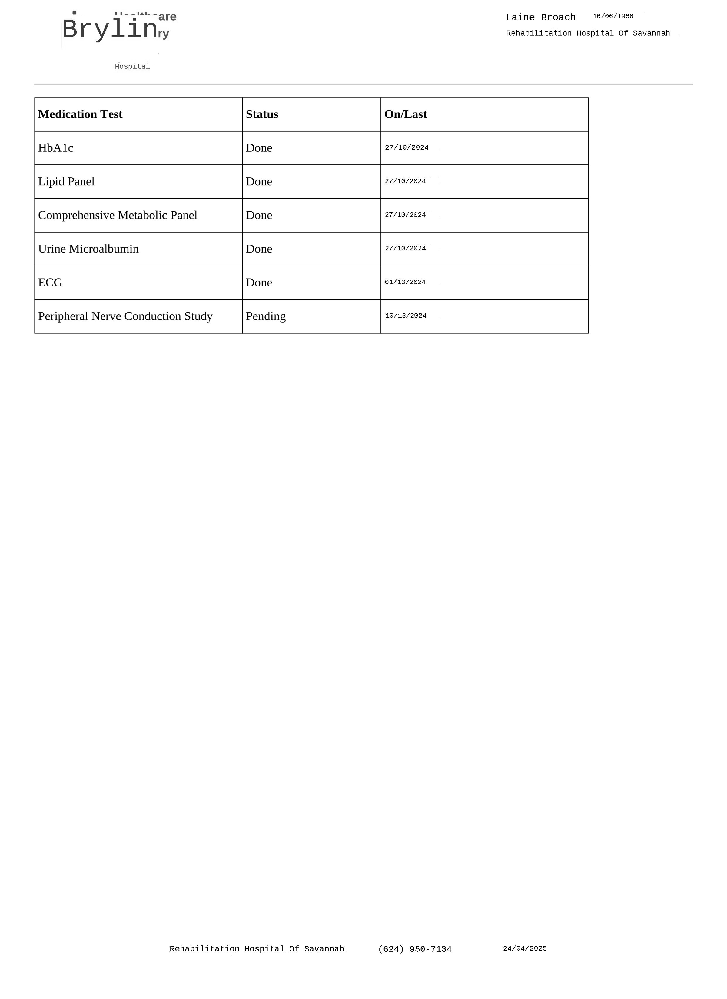


    Image #1:
    Origin: file:/content/PDF_Deid_Deidentification_3.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


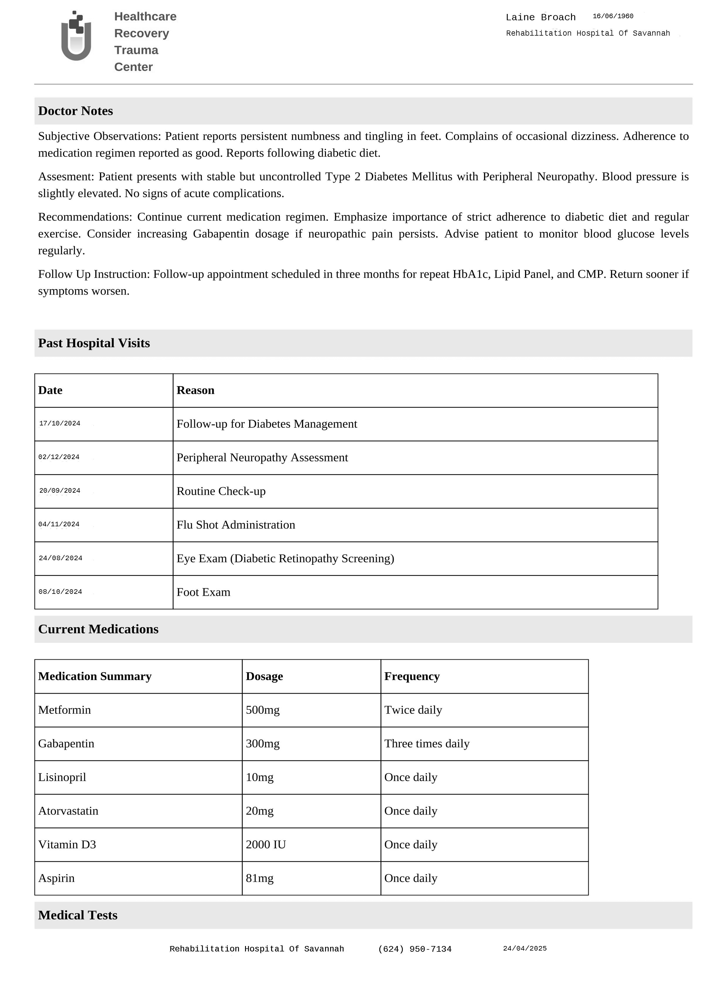


    Image #2:
    Origin: file:/content/PDF_Deid_Deidentification_3.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


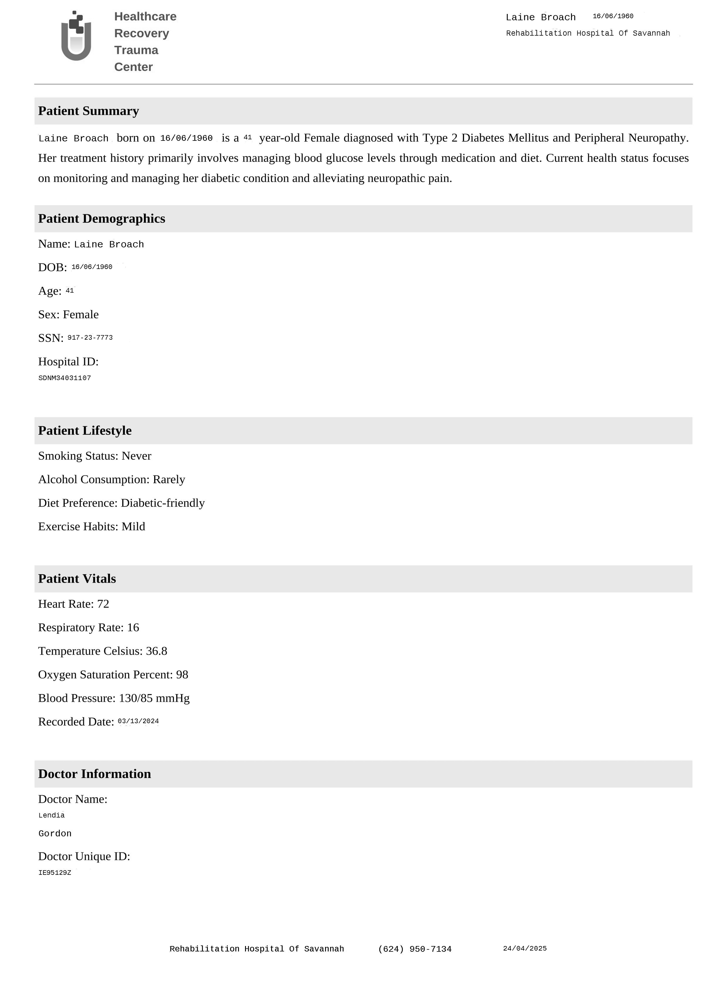

In [ ]:
from sparkocr.utils import *
display_pdf(df6)

###7. pdf_deid_subentity_context_augmented_pipeline

This pipeline can be used to redact PHI information in PDFs.

####Load pretrained pipeline

In [ ]:
from sparknlp.pretrained import PretrainedPipeline
deid_pipeline7 = PretrainedPipeline("pdf_deid_subentity_context_augmented_pipeline", "en", "clinical/models")

pdf_deid_subentity_context_augmented_pipeline download started this may take some time.
Approx size to download 1.6 GB
[OK!]


####Load test pdf

In [ ]:
pdf_path7 = '/content/PDF_Deid_Deidentification_1.pdf'
pdf_example_df7 = spark.read.format("binaryFile").load(pdf_path7).cache()
pdf_example_df7.select("path").show(truncate=False)

+---------------------------------------------+
|path                                         |
+---------------------------------------------+
|file:/content/PDF_Deid_Deidentification_1.pdf|
+---------------------------------------------+



####Run pipeline

In [ ]:
result7 = deid_pipeline7.transform(pdf_example_df7)
df7 = result7.select("path", "pdf").withColumnRenamed("pdf", "content")

####Show results


    Image #0:
    Origin: file:/content/PDF_Deid_Deidentification_1.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


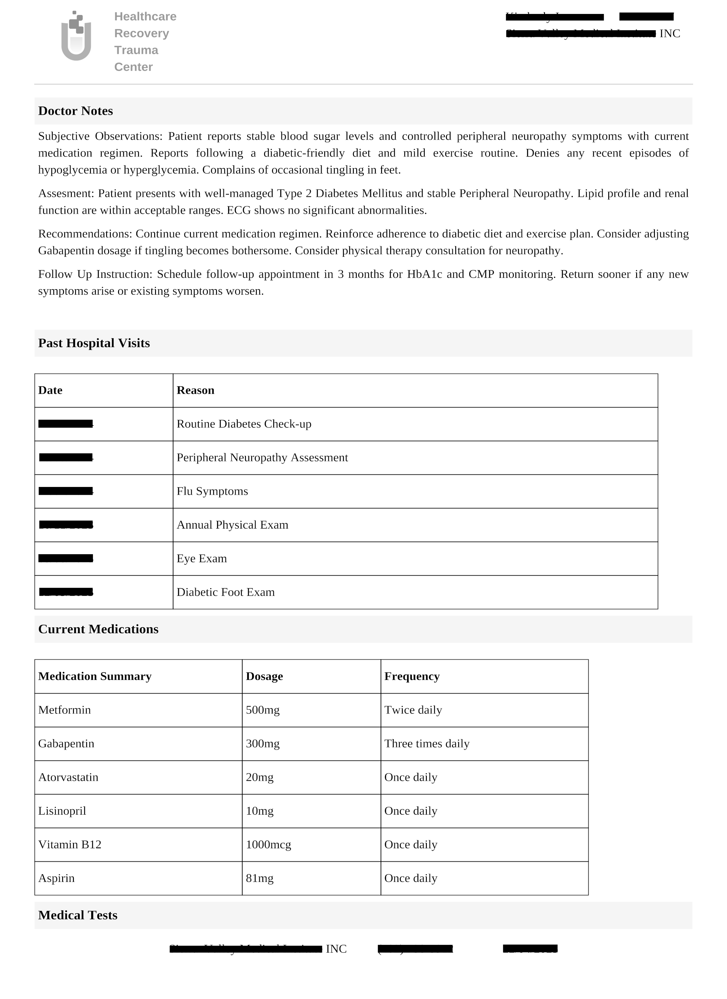


    Image #1:
    Origin: file:/content/PDF_Deid_Deidentification_1.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


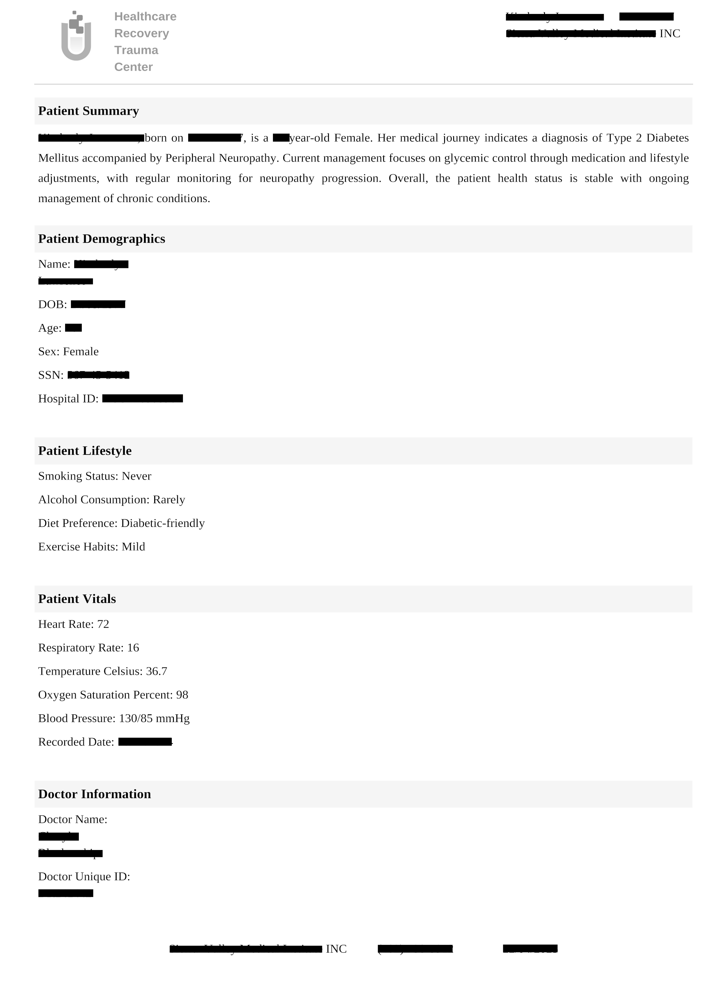


    Image #2:
    Origin: file:/content/PDF_Deid_Deidentification_1.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


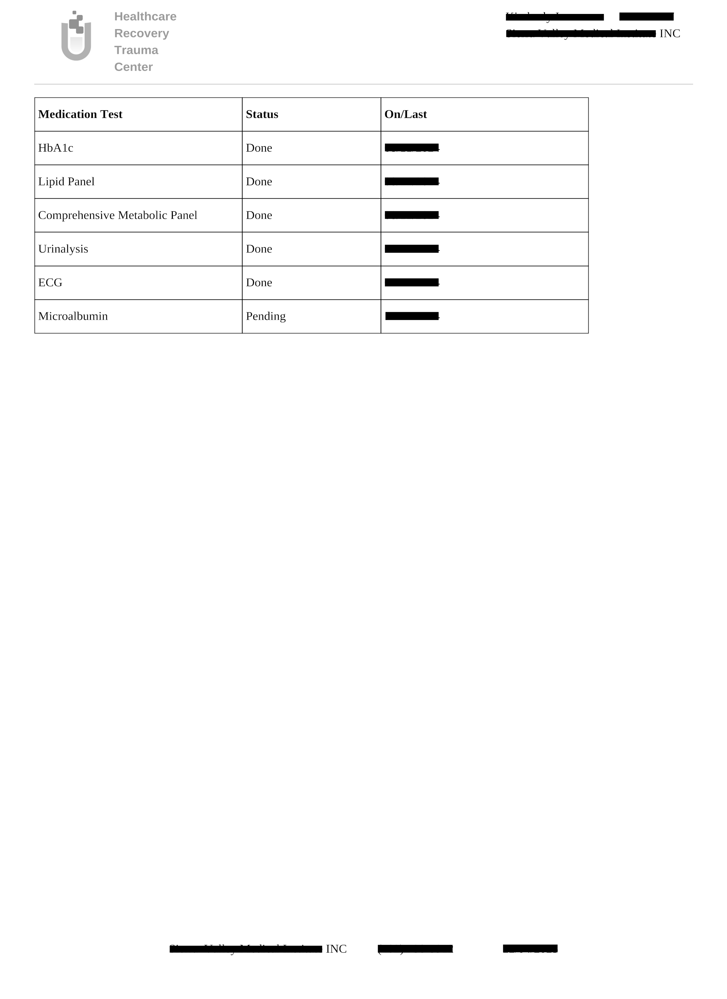

In [ ]:
from sparkocr.utils import *
display_pdf(df7)